# Notebook asociated to the v2 latex document

### We compute the U_+ fields on the CPU

Set the relevant parameters and variables

In [9]:
import numpy as np

# hbar * c [GeV * fm]
hbarc = 0.197326 

# Simulation box 
L = 2.5         
N = 128 
tau_sim = 1.25    
DTS = 8

# Derived parameters
a = L/N
E0 = N / L * hbarc
DT = 1.0 / DTS
maxt = int(tau_sim / a * DTS)
nplus = maxt//DTS     

# Glasma fields
su_group = 'su3'
Qs = 2        
ns = 50    
factor = 0.68        
g2mu = Qs / factor     
g = np.pi * np.sqrt(1 / np.log(Qs / 0.2))          		
mu = g2mu / g**2          	
ir = 0.2 * g**2 * mu         
uv = 10.0       


nevents = 10

In [10]:
import os

os.environ["MY_NUMBA_TARGET"] = "numba"
os.environ["PRECISION"] = "double"
os.environ['GAUGE_GROUP'] = su_group

# Import relevant modules
import sys
sys.path.append('..')

# Glasma modules
import curraun.core as core
import curraun.mv as mv
import curraun.initial as initial
initial.DEBUG = False

import curraun.su as su
from curraun.numba_target import use_cuda
if use_cuda:
    from numba import cuda

import curraun.su as su

Define the simulation routine

In [11]:
from tqdm import tqdm 

# Simulation routine
def simulate():
    
    # Dictionary to store the results
    output = {}
    
    # Derived parameters
    a = L/N
    E0 = N/L*hbarc
    DT = 1.0/DTS 
    maxt = int(tau_sim/a*DTS)
    
    # We create the object Glasma Simulation
    s = core.Simulation(N, DT, g)
    
    # We intialize the Glasma fields
    va = mv.wilson(s, mu=mu/E0, m=ir/E0, uv=uv/E0, num_sheets=ns)
    vb = mv.wilson(s, mu=mu/E0, m=ir/E0, uv=uv/E0, num_sheets=ns)
    initial.init(s, va, vb)
    
    # We create objects to store the relevant gauge links
    ux = np.zeros((maxt//DTS, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    ut = np.zeros((maxt//DTS, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    up = np.zeros((maxt//DTS, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    up_reorder = np.zeros((maxt//DTS, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    # ux_reorder = np.zeros((maxt//DTS, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    # ut_reorder = np.zeros((maxt//DTS, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    
    # We set them to unit
    for xplus in range(maxt//DTS):
        for y in range(N):
            for z in range(N):
                ux[xplus, y, z] = su.unit()
                ut[xplus, y, z] = su.unit()
                up[xplus, y, z] = su.unit()
    
    # We create objects to store the fields at every time step
    ux_sim = np.zeros((maxt, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    aeta_sim = np.zeros((maxt, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    
    # We start the simulation
    with tqdm(total=maxt) as pbar:
        for t in range(maxt):
            
            # Evolve the Glasma fields
            core.evolve_leapfrog(s)
            
            u1 = s.u1.copy()
            ux_sim[t] = u1[:, 0, :].reshape(N, N, su.GROUP_ELEMENTS)
            
            aeta1 = s.aeta1.copy()
            aeta_sim[t] = aeta1.reshape(N, N, su.GROUP_ELEMENTS)
            
            # When t/a is an integer we compute the LC coordinate links
            if t%DTS == 0:
                xplus = t//DTS
                
                for y in range(N):
                    for z in range(N):
                        
                        if -xplus<(z-N/2)<xplus:
                            
                            # We extract the temporal index
                            tau = round(DTS*np.sqrt((xplus)**2-(z-N/2)**2))
                            
                            # We compute the x link
                            ux[xplus, y, z] = su.dagger(ux_sim[tau, xplus, y])
                            
                            # We compute the t link
                            aeta_dag = su.dagger(aeta_sim[tau, xplus, y])
                            aeta_fact = su.mul_s(aeta_dag, -(z-N/2)/((xplus)**2-(z-N/2)**2))
                            ut[xplus, y, z] = su.mexp(aeta_fact)
                            
                            # We compute the plus link
                            up[xplus, y, z] = su.mul(ut[xplus, y, z], ux[xplus, y, z])
                            
                        if z-N/2 >= 0:
                            up_reorder[xplus, y, z-N//2] = up[xplus, y, z]
                            # ux_reorder[xplus, y, z-N//2] = ux[xplus, y, z]
                            # ut_reorder[xplus, y, z-N//2] = ut[xplus, y, z]
                        else:
                            up_reorder[xplus, y, N//2+z] = up[xplus, y, z]
                            # ux_reorder[xplus, y, N//2+z] = ux[xplus, y, z]
                            # ut_reorder[xplus, y, N//2+z] = ut[xplus, y, z]
                            
                        
                            
                        
                            
            pbar.update(1)
            
    if use_cuda:
        cuda.current_context().deallocations.clear()
    
    # We reshape the transverse component as an N*N array to input in Meijian's code
    up_jetsim = up_reorder.reshape(maxt//DTS, N*N, su.GROUP_ELEMENTS)
    # ux_jetsim = ux_reorder.reshape(maxt//DTS, N*N, su.GROUP_ELEMENTS)
    # ut_jetsim = ut_reorder.reshape(maxt//DTS, N*N, su.GROUP_ELEMENTS)
        
    # Write the results to the dictionary
    output["ux"] = ux
    output["ut"] = ut
    output["up"] = up
    output['up_out'] = up_jetsim
    # output['ux_out'] = ux_jetsim
    # output['ut_out'] = ut_jetsim
    
    return output

Perform the simulation

In [ ]:
import warnings
warnings.filterwarnings('ignore')

for n in range (nevents):
    
    output = simulate()
    ux = output['ux']
    ut = output['ut']
    up = output['up']
    up_out = output['up_out']
    # ux_out = output['ux_out']
    # ut_out = output['ut_out']
    
    # np.save(os.path.join('v2_fields', 'ux_temp', 'result_%i.npy' %n), ux_out)
    # np.save(os.path.join('v2_fields', 'ut_temp', 'result_%i.npy' %n), ut_out)
    np.save(os.path.join('simulations', 'up_temp', 'result_%i.npy' %n), up_out)
    

Kernel xi: 0 d:  0 did not reach goal. check:  0.004415745482699152
Kernel xi: 0 d:  1 did not reach goal. check:  0.003962747666483256
Kernel xi: 1 d:  0 did not reach goal. check:  0.002594319305572569
Kernel xi: 1 d:  1 did not reach goal. check:  0.006484429285150257
Kernel xi: 2 d:  0 did not reach goal. check:  0.001335346133485481
Kernel xi: 2 d:  1 did not reach goal. check:  0.0055856909366124394
Kernel xi: 3 d:  0 did not reach goal. check:  0.0010378045561190022
Kernel xi: 3 d:  1 did not reach goal. check:  0.004557167012128772
Kernel xi: 4 d:  0 did not reach goal. check:  0.0009607483347305077
Kernel xi: 4 d:  1 did not reach goal. check:  0.005468772902404356
Kernel xi: 5 d:  0 did not reach goal. check:  0.0014334036358447301
Kernel xi: 5 d:  1 did not reach goal. check:  0.008254685550387853
Kernel xi: 6 d:  0 did not reach goal. check:  0.0020578906455232518
Kernel xi: 6 d:  1 did not reach goal. check:  0.00975686844554669
Kernel xi: 7 d:  0 did not reach goal. check

100%|██████████| 512/512 [00:09<00:00, 56.20it/s] 


Kernel xi: 0 d:  0 did not reach goal. check:  0.004848440237116365
Kernel xi: 0 d:  1 did not reach goal. check:  0.0005316760575499686
Kernel xi: 1 d:  0 did not reach goal. check:  0.0035931934898845246
Kernel xi: 1 d:  1 did not reach goal. check:  0.00031421605327884133
Kernel xi: 2 d:  0 did not reach goal. check:  0.004206372692458219
Kernel xi: 2 d:  1 did not reach goal. check:  0.0010223830898227328
Kernel xi: 3 d:  0 did not reach goal. check:  0.005861554695608994
Kernel xi: 3 d:  1 did not reach goal. check:  0.0015525461708888494
Kernel xi: 4 d:  0 did not reach goal. check:  0.008136892887684412
Kernel xi: 4 d:  1 did not reach goal. check:  0.0013784457328391122
Kernel xi: 5 d:  0 did not reach goal. check:  0.010872103686572045
Kernel xi: 5 d:  1 did not reach goal. check:  0.0015731906032664107
Kernel xi: 6 d:  0 did not reach goal. check:  0.012553755205172983
Kernel xi: 6 d:  1 did not reach goal. check:  0.0021129696262438234
Kernel xi: 7 d:  0 did not reach goal. 

100%|██████████| 512/512 [00:10<00:00, 47.70it/s]


Kernel xi: 0 d:  0 did not reach goal. check:  0.001218488712396131
Kernel xi: 0 d:  1 did not reach goal. check:  0.003116962100389068
Kernel xi: 1 d:  0 did not reach goal. check:  0.0023719239703120566
Kernel xi: 1 d:  1 did not reach goal. check:  0.003695119465083452
Kernel xi: 2 d:  0 did not reach goal. check:  0.004189981235058406
Kernel xi: 2 d:  1 did not reach goal. check:  0.002935634695733251
Kernel xi: 3 d:  0 did not reach goal. check:  0.005467188666699675
Kernel xi: 3 d:  1 did not reach goal. check:  0.004732595640362705
Kernel xi: 4 d:  0 did not reach goal. check:  0.005564165927983538
Kernel xi: 4 d:  1 did not reach goal. check:  0.006643262768628158
Kernel xi: 5 d:  0 did not reach goal. check:  0.008595587708937886
Kernel xi: 5 d:  1 did not reach goal. check:  0.005130870765814734
Kernel xi: 6 d:  0 did not reach goal. check:  0.013202231380151594
Kernel xi: 6 d:  1 did not reach goal. check:  0.0032575316347074595
Kernel xi: 7 d:  0 did not reach goal. check: 

100%|██████████| 512/512 [00:09<00:00, 53.83it/s] 


Kernel xi: 0 d:  0 did not reach goal. check:  0.006587423353551449
Kernel xi: 0 d:  1 did not reach goal. check:  0.0018358637942634968
Kernel xi: 1 d:  0 did not reach goal. check:  0.005462404325768592
Kernel xi: 1 d:  1 did not reach goal. check:  0.002190411596143243
Kernel xi: 2 d:  0 did not reach goal. check:  0.003526000960606133
Kernel xi: 2 d:  1 did not reach goal. check:  0.001196401284305479
Kernel xi: 3 d:  0 did not reach goal. check:  0.0020745809909186066
Kernel xi: 3 d:  1 did not reach goal. check:  0.00175739419771767
Kernel xi: 4 d:  0 did not reach goal. check:  0.0019545771927148314
Kernel xi: 4 d:  1 did not reach goal. check:  0.00092207723145988
Kernel xi: 5 d:  0 did not reach goal. check:  0.002310450891582792
Kernel xi: 5 d:  1 did not reach goal. check:  0.00027657666235851244
Kernel xi: 6 d:  0 did not reach goal. check:  0.002696406464615814
Kernel xi: 6 d:  1 did not reach goal. check:  0.000645429332022608
Kernel xi: 7 d:  0 did not reach goal. check:

100%|██████████| 512/512 [00:09<00:00, 51.92it/s]


Kernel xi: 0 d:  0 did not reach goal. check:  0.0047858268189633815
Kernel xi: 0 d:  1 did not reach goal. check:  0.005542877788883879
Kernel xi: 1 d:  0 did not reach goal. check:  0.0050662588407595814
Kernel xi: 1 d:  1 did not reach goal. check:  0.006851027497200233
Kernel xi: 2 d:  0 did not reach goal. check:  0.006107483461649087
Kernel xi: 2 d:  1 did not reach goal. check:  0.005129803895527705
Kernel xi: 3 d:  0 did not reach goal. check:  0.007280652674921245
Kernel xi: 3 d:  1 did not reach goal. check:  0.002140340772672555
Kernel xi: 4 d:  0 did not reach goal. check:  0.00705599678361114
Kernel xi: 4 d:  1 did not reach goal. check:  0.0005219700547446599
Kernel xi: 5 d:  0 did not reach goal. check:  0.00569638724602013
Kernel xi: 5 d:  1 did not reach goal. check:  0.00045693548957992207
Kernel xi: 6 d:  0 did not reach goal. check:  0.004783189022869398
Kernel xi: 6 d:  1 did not reach goal. check:  0.0007548388271478469
Kernel xi: 7 d:  0 did not reach goal. check

100%|██████████| 512/512 [00:09<00:00, 52.52it/s] 


Kernel xi: 0 d:  0 did not reach goal. check:  0.0007633793875883143
Kernel xi: 0 d:  1 did not reach goal. check:  0.0069351939586933
Kernel xi: 1 d:  0 did not reach goal. check:  0.0016880022873522024
Kernel xi: 1 d:  1 did not reach goal. check:  0.00439739374173192
Kernel xi: 2 d:  0 did not reach goal. check:  0.0029476521518010204
Kernel xi: 2 d:  1 did not reach goal. check:  0.0028785354728877678
Kernel xi: 3 d:  0 did not reach goal. check:  0.0035640262847487026
Kernel xi: 3 d:  1 did not reach goal. check:  0.0024913470432195196
Kernel xi: 4 d:  0 did not reach goal. check:  0.0029247896761055384
Kernel xi: 4 d:  1 did not reach goal. check:  0.002267494040751153
Kernel xi: 5 d:  0 did not reach goal. check:  0.0019322443283339814
Kernel xi: 5 d:  1 did not reach goal. check:  0.002464971833796298
Kernel xi: 6 d:  0 did not reach goal. check:  0.0017074257824620256
Kernel xi: 6 d:  1 did not reach goal. check:  0.0010004778104738428
Kernel xi: 7 d:  0 did not reach goal. ch

We plot the results

In [5]:
# Extract the color components

ux_comp = np.apply_along_axis(su.get_algebra_factors_from_group_element_approximate, 3, ux)
ut_comp = np.apply_along_axis(su.get_algebra_factors_from_group_element_approximate, 3, ut)
up_comp = np.apply_along_axis(su.get_algebra_factors_from_group_element_approximate, 3, up)

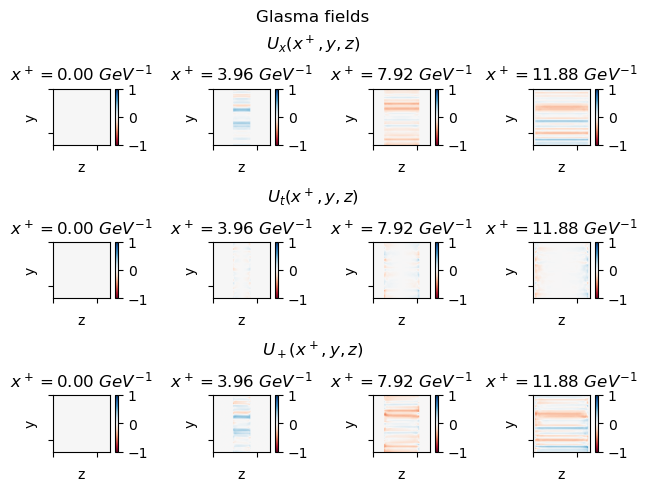

In [6]:
# We plot the results
import matplotlib.pyplot as plt

fig = plt.figure(constrained_layout=True)
fig.suptitle('Glasma fields')

# We create a subfigure for every row
subfigs = fig.subfigures(nrows=3, ncols=1)
titles = [r'$U_x(x^+, y, z)$', r'$U_t(x^+, y, z)$', r'$U_+(x^+, y, z)$']
for row, subfig in enumerate(subfigs):
    subfig.suptitle(titles[row])
    
    # We create for figures for every row
    axs = subfig.subplots(nrows=1, ncols=4)
    for col, ax in enumerate(axs):
        xplus = 20*col
        
        if row == 0:
            plot = axs[col].imshow(ux_comp[xplus, :, :, 0].real, cmap='RdBu', vmin=-1, vmax=1)
        
        if row == 1:
            plot = axs[col].imshow(ut_comp[xplus, :, :, 0].real, cmap='RdBu', vmin=-1, vmax=1)
        
        if row ==2:
            plot = axs[col].imshow(up_comp[xplus, :, :, 0].real, cmap='RdBu', vmin=-1, vmax=1) 
        
        cbar = plt.colorbar(plot, ax = axs[col])
        axs[col].set_xticklabels([]); axs[col].set_yticklabels([])
        axs[col].set_ylabel('y'); axs[col].set_xlabel('z')
        axs[col].set_title(r'$x^+ = %.2f\ GeV^{-1}$' %(2*a*xplus/hbarc))
    
plt.savefig('v2_fields/temporal_gauge_fields', bbox_inches='tight')

### We transform the $U_x$ links to the LC gauge neglecting the $U_x$ links

We define gain the parameters and the environment

In [13]:
import numpy as np

# hbar * c [GeV * fm]
hbarc = 0.197326 

# Simulation box 
L = 2.5         
N = 128 
tau_sim = 1.25    
DTS = 8

# Derived parameters
a = L/N
E0 = N / L * hbarc
DT = 1.0 / DTS
maxt = int(tau_sim / a * DTS)
nplus = maxt//DTS     

# Glasma fields
su_group = 'su3'
Qs = 2        
ns = 50    
factor = 0.68        
g2mu = Qs / factor     
g = np.pi * np.sqrt(1 / np.log(Qs / 0.2))          		
mu = g2mu / g**2          	
ir = 0.2 * g**2 * mu         
uv = 10.0       


nevents = 1

In [14]:
import os

os.environ["MY_NUMBA_TARGET"] = "numba"
os.environ["PRECISION"] = "double"
os.environ['GAUGE_GROUP'] = su_group

# Import relevant modules
import sys
sys.path.append('..')

# Glasma modules
import curraun.core as core
import curraun.mv as mv
import curraun.initial as initial
initial.DEBUG = False

import curraun.su as su
from curraun.numba_target import use_cuda
if use_cuda:
    from numba import cuda

import curraun.su as su

We define again the simulation routine

In [ ]:
from tqdm import tqdm 

# Simulation routine
def simulate():
    
    # Dictionary to store the results
    output = {}
    
    # Derived parameters
    a = L/N
    E0 = N/L*hbarc
    DT = 1.0/DTS 
    maxt = int(tau_sim/a*DTS)
    
    # We create the object Glasma Simulation
    s = core.Simulation(N, DT, g)
    
    # We intialize the Glasma fields
    va = mv.wilson(s, mu=mu/E0, m=ir/E0, uv=uv/E0, num_sheets=ns)
    vb = mv.wilson(s, mu=mu/E0, m=ir/E0, uv=uv/E0, num_sheets=ns)
    initial.init(s, va, vb)
    
    # We create objects to store the fields at every time step
    ux_sim = np.zeros((maxt, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    aeta_sim = np.zeros((maxt, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    
    # We create an object to store U_+ before the gauge transformation
    up = np.zeros((maxt//DTS, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    
    # We create objects to store the gauge transformation operator
    vlc0 = np.zeros((N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    vlc1 = np.zeros((N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    vlc_dag = np.zeros((maxt//DTS, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    
    # We create objects to store the transformed fields
    up_lc = np.zeros((maxt//DTS-1, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    up_lc_reorder = np.zeros((maxt//DTS-1, N, N, su.GROUP_ELEMENTS), dtype=su.GROUP_TYPE)
    
    # We set them to unit
    for xplus in range(maxt//DTS):
        for y in range(N):
            for z in range(N):
                up[xplus, y, z] = su.unit()
                
                vlc0[y, z] = su.unit()
                vlc1[y, z] = su.unit()
                
    
    # We start the simulation
    with tqdm(total=maxt) as pbar:
        for t in range(maxt):
            
            # Evolve the Glasma fields
            core.evolve_leapfrog(s)
            
            # Copy the Glasma fields to our objects
            u1 = s.u1.copy()
            ux_sim[t] = u1[:, 0, :].reshape(N, N, su.GROUP_ELEMENTS)
            
            aeta1 = s.aeta1.copy()
            aeta_sim[t] = aeta1.reshape(N, N, su.GROUP_ELEMENTS)
            
            # When t/a is an integer we transform Ux
            if t%DTS == 0:
                xplus = t//DTS
                
                for y in range(N):
                    for z in range(N):
                        
                        # We compute the links in temporal gauge
                        if -xplus<(z-N/2)<xplus:
                            tau = round(DTS*np.sqrt((xplus)**2-(z-N/2)**2))
                            
                            ux = ux_sim[tau, xplus, y]
                            
                            aeta = aeta_sim[tau, xplus, y]
                            aeta_fact = su.mul_s(aeta, -z/((xplus+1/2)**2-(z-N/2)**2))
                            ut = su.mexp(aeta_fact)
                            
                            up_dag = su.mul(ut, ux)
                            
                            up[xplus, y, z] = su.dagger(up_dag)
                        
                        # We compute the gauge transformation operator
                        for xminus in (-xplus, -1):
                            if -(xplus+xminus)<(z-N/2)<(xplus+xminus):
                                
                                tau_t = round(DTS*np.sqrt((xplus+xminus)**2-(z-N/2)**2))
                                
                                ux_t = ux_sim[tau_t, xplus-xminus, y]
                                ux_t_dag = su.dagger(ux_t)
                                
                                aeta_t = aeta_sim[tau_t, xplus-xminus, y]
                                aeta_t_fact = su.mul_s(aeta_t, -z/((xplus+xminus+1/2)**2-(z-N/2)**2))
                                ut_t = su.mexp(aeta_t_fact)
                                
                                aux = su.mul(ut_t, ux_t_dag)
                                
                                # aux = su.mul(ut_t, ux_t)
                                vlc1[y, z] = su.mul(aux, vlc0[y,z])
                            
                        vlc_dag[xplus, y, z] = vlc1[y, z]
                        
                        # We perform the gauge trnasformation
                        if xplus != 0:
                            vlc = su.dagger(vlc_dag[xplus-1, y, z])
                            aux = su.mul(up[xplus-1, y, z], vlc_dag[xplus, y, z])
                            up_lc_sim = su.mul(vlc, aux)
                            up_lc[xplus-1, y, z] = su.dagger(up_lc_sim)
                        
                        # We reorder the fields in a suitable format to input in Meijian's code
                        if z-N/2 >= 0:
                            up_lc_reorder[xplus-1, y, z-N//2] = up_lc[xplus-1, y, z]
                            
                        else:
                            up_lc_reorder[xplus-1, y, N//2+z] = up_lc[xplus-1, y, z]
                        
                            
                            
            pbar.update(1)
            
    if use_cuda:
        cuda.current_context().deallocations.clear()
    
    # We reshape the results to input in Meijian's code
    up_lc_out = up_lc_reorder.reshape(maxt//DTS-1, N*N, su.GROUP_ELEMENTS)
        
    # Write the results to the dictionary
    output['up_lc'] = up_lc
    output['up_lc_out'] = up_lc_out
    
    return output

In [20]:
import warnings
warnings.filterwarnings('ignore')

for n in range (nevents):
    
    output = simulate()
    up_lc_out = output['up_lc_out']
    up_lc = output['up_lc']
    
    np.save(os.path.join('v2_fields', 'up_lc', 'result_%i.npy' %n), up_lc_out)

Kernel xi: 0 d:  0 did not reach goal. check:  0.0001410486504774197
Kernel xi: 0 d:  1 did not reach goal. check:  0.00362102225759435
Kernel xi: 1 d:  0 did not reach goal. check:  0.00010739676995114188
Kernel xi: 1 d:  1 did not reach goal. check:  0.00512777315404826
Kernel xi: 2 d:  0 did not reach goal. check:  0.00036087106316698875
Kernel xi: 2 d:  1 did not reach goal. check:  0.006227060534413837
Kernel xi: 3 d:  0 did not reach goal. check:  0.000558630947004944
Kernel xi: 3 d:  1 did not reach goal. check:  0.0039060897141620205
Kernel xi: 4 d:  0 did not reach goal. check:  0.0005830731771962785
Kernel xi: 4 d:  1 did not reach goal. check:  0.00031105429574365684
Kernel xi: 5 d:  0 did not reach goal. check:  0.0011259219473502776
Kernel xi: 5 d:  1 did not reach goal. check:  0.0014502848251746123
Kernel xi: 6 d:  0 did not reach goal. check:  0.002421774714848338
Kernel xi: 6 d:  1 did not reach goal. check:  0.006311184229959722
Kernel xi: 7 d:  0 did not reach goal. 

100%|██████████| 512/512 [00:16<00:00, 30.13it/s]


In [21]:
# Extract the color components

up_lc_comp = np.apply_along_axis(su.get_algebra_factors_from_group_element_approximate, 3, up_lc)

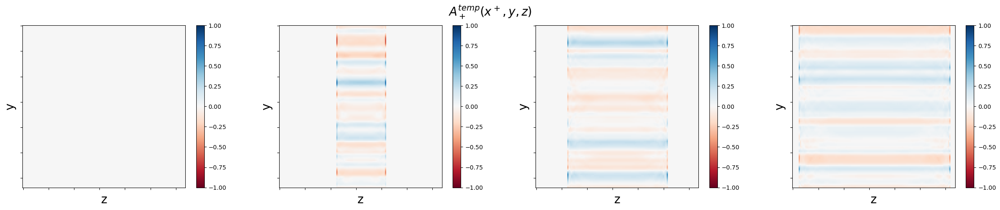

In [22]:
# We plot the reordered temporal gauge results
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, nplus//20 +1, figsize=(30,5))
fig.suptitle(r'$A_+^{temp}(x^+, y, z)$', fontsize=20)

for t in range(nplus//20 + 1): 
    tau = 20*t
    
    plot1 = axs[t].imshow(up_lc_comp[tau, :, :, 0].real, cmap='RdBu', vmin=-1, vmax=1) 
    cbar = plt.colorbar(plot1, ax = axs[t])
    
    axs[t].set_xticklabels([]); axs[t].set_yticklabels([])
    axs[t].set_ylabel('y', fontsize=20); axs[t].set_xlabel('z', fontsize=20)